<a href="https://colab.research.google.com/github/SaranLingam/EE8603/blob/main/EE8603_Red_Wine_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **EE8603**

**Saranja Annalingam**

**500596397**

# Introduction

This project uses several regression models to predict the alcohol content in red wine using the wine quality dataset from the UCI Machine Learning Repository. The dataset contains 1599 samples of red vinho verde wines from northern Portugal.

# Installation

 The project will use the PyCaret ML library.The PyCaret is installed in Colab. This will allow to access and utilize the library’s functions and features within these environments. This line of code installs several Python libraries that are necessary for using PyCaret.

 Install PyCaret with Python's pip package manager:

In [ ]:
!pip install pycaret[full]

Next, necessary python libraries are imported for this project. Pandas is already installed on Google Colab.

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# check installed version (must be >3.0)
import pycaret
pycaret.__version__

'3.2.0'

# Data Preparation

To help identify the target variable from the remaining variables, the dataset should be check. Pandas can be used to preview the few rows of the table.

In [ ]:
# Import the data
!wget -q https://archive.ics.uci.edu/static/public/186/wine+quality.zip -O wine.zip
!unzip -q wine.zip

In [ ]:
# Load th dataset and separate each semicolon into columns
data = pd.read_csv('winequality-red.csv' , delimiter= ";" )
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5



# Data Discription
I tried to extract some more informations about the dataset and the type of data. Firstly I tried to figure out which types of data the dataset is composed by, and if it contains null values


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


We can look at the shape of the dataset like how many rows and columns are there.

In [ ]:
data.shape

(1599, 12)

In [ ]:
from pandas_profiling import ProfileReport
# run profile
profile = ProfileReport(data, title = 'Report - Pandas Profiling',html={'style':{'full_with': True}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In our dataset we have 1599 rows and 12 columns.

# Preprocessing
There are duplicate rows in our dataset. we need to remove them for better predictions.

In [ ]:
# show the duplicate rows
duplicate_rows = data.duplicated()
data[duplicate_rows]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


In [ ]:
# drop the duplicte rows
newdata = data.drop_duplicates()
newdata.shape
newdata

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
newdata.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

Returns the number of unique values for each variable.

In [ ]:
data.nunique(axis=0)

fixed acidity            96
volatile acidity        143
citric acid              80
residual sugar           91
chlorides               153
free sulfur dioxide      60
total sulfur dioxide    144
density                 436
pH                       89
sulphates                96
alcohol                  65
quality                   6
dtype: int64

Summarizes the count, mean, standard deviation, min, and max for numeric variables.

In [ ]:
# Compute statistics
newdata.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


The mean alcohol is 10.43, with its Max (best quality score) being 14.9 & its Min (worst quality score) being 8.40. Now let's see if we have any missing values we need to take care of.

#Missing Values

Display the Number of Missing Values for each column. We luckily have none.

In [ ]:
# Display the Missing Values

print(newdata.isna().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


#Detecting/Handling Outliers with Z-Score
Detection and handling of outliers are important in data preprocessing to ensure that they don't disproportionately influence the results of statistical analyses or machine learning models. A Z-Score is a measure of position that indicates the number of standard deviations a data value lies from the mean. Any z-score less than -3 or greater than 3, is an outlier. From the empirical rule we see that 99.7% of our data should be within 3 standard deviations from the mean.

In [ ]:
# obtain the Z-Scores
from scipy import stats
z = np.abs(stats.zscore(newdata))
print(z)

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0          0.524431          0.932000     1.393258        0.461157   0.245623   
1          0.294063          1.915800     1.393258        0.056665   0.200094   
2          0.294063          1.259934     1.188617        0.165259   0.078535   
3          1.664067          1.363534     1.471711        0.461157   0.265883   
5          0.524431          0.713378     1.393258        0.535132   0.265883   
...             ...               ...          ...             ...        ...   
1593       0.869983          0.494756     0.983977        0.461157   0.407702   
1594       1.215536          0.385444     0.983977        0.387183   0.038015   
1595       1.388312          0.112167     0.881656        0.239233   0.529261   
1597       1.388312          0.631395     0.779336        0.387183   0.265883   
1598       1.330720          1.199567     1.011270        0.796410   0.427962   

      free sulfur dioxide  

Next, we will want to grab the rows & columns that have a Z-Score greater than 3. These are considered outliers.

In [ ]:
threshold = 3
print(np.where(z > 3))

(array([  11,   12,   13,   13,   15,   15,   17,   30,   35,   38,   39,
         41,   53,   75,   75,   77,   80,   82,   85,   87,   96,   96,
         99,  114,  115,  127,  135,  135,  135,  135,  144,  145,  150,
        150,  159,  176,  202,  202,  211,  214,  226,  226,  241,  245,
        252,  282,  295,  296,  302,  309,  328,  334,  346,  346,  361,
        363,  385,  385,  393,  400,  408,  420,  420,  433,  448,  450,
        473,  483,  483,  485,  485,  492,  506,  510,  513,  516,  528,
        534,  555,  562,  562,  564,  565,  565,  565,  582,  582,  592,
        597,  597,  599,  602,  626,  627,  632,  652,  671,  672,  687,
        710,  718,  722,  764,  764,  771,  781,  786,  791,  792,  838,
        866,  888,  895,  895,  912,  918,  918,  920,  920,  945,  948,
        963,  985,  994, 1003, 1013, 1049, 1052, 1060, 1060, 1060, 1073,
       1081, 1081, 1082, 1082, 1103, 1106, 1106, 1107, 1117, 1121, 1123,
       1123, 1125, 1151, 1159, 1162, 1165, 1165, 1

The 1st array is the list of row numbers & the 2nd array is the corresponding column number of the outlier. For example, the first outlier is in row 13, column 9. Once we calculated the Z-Score, we can remove the outlier to clean our data, by performing the action below.

In [ ]:
Newdata = newdata[(z < 3).all(axis=1)]
Newdata

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


We have now successfully removed 148+ rows which were outliers. Let's take a look at our new cleaned up data.

In [ ]:
Newdata.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000,1232.000000
mean,8.303328,0.524144,0.266266,2.376948,0.081702,15.185877,44.353896,0.996673,3.313360,0.642192,10.425785,5.646916
std,1.649113,0.171969,0.190753,0.823759,0.022433,9.335015,30.051752,0.001714,0.140937,0.129924,1.038477,0.792639
min,5.000000,0.120000,0.000000,1.200000,0.038000,1.000000,6.000000,0.991500,2.880000,0.330000,8.500000,4.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,21.000000,0.995600,3.220000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.636250,0.420000,2.600000,0.089000,21.000000,60.000000,0.997800,3.400000,0.710000,11.100000,6.000000
max,13.500000,1.070000,0.790000,6.550000,0.236000,47.000000,147.000000,1.002200,3.750000,1.170000,13.600000,8.000000


# Correlations

Correlation Matrix aka Heat Maps- lets us see correlations between all variables. From the heatmap we can see whether something is positively or negatively correlated with our target.

<AxesSubplot: >

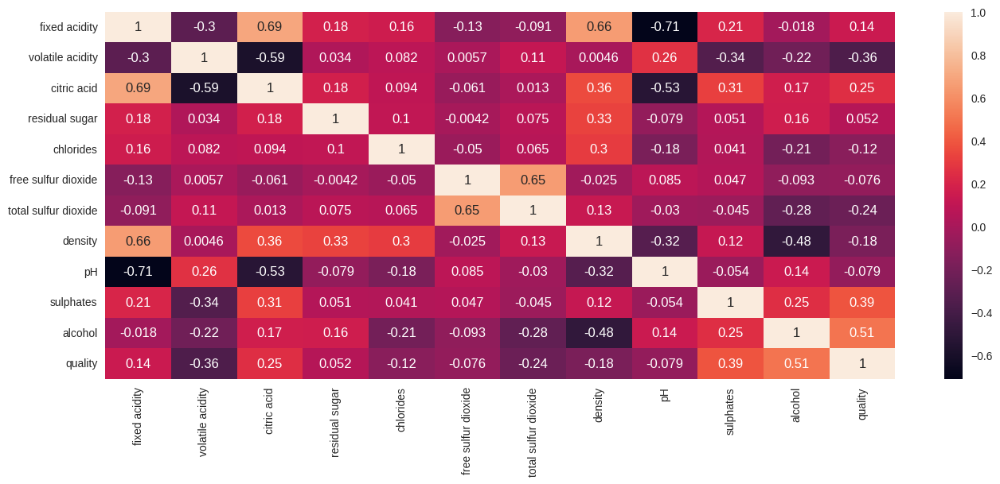

In [ ]:
# calculate correlation matrix
# heatmap
plt.figure(figsize=[16,6])
sns.heatmap(Newdata.corr(), annot=True)

We can see there is a strong positive correlation between quality and our target. In fact, this is the most correlated feature in our data set with a value of 0.51.
Next, we can see the second strongest positive correlation, 0.25, between Sulphates and alcohol predictor. This is as expected because  SO² is acid. Lastly, the strongest negative correlation is the density, with a correlation of -0.48.

# Pair Plots

Pair Plots are also a great way to immediately see the correlations between all variables.
Because we have 11 Features, lets only select significant features that correlate to our target, to further examine their correlation on a Pair plot.

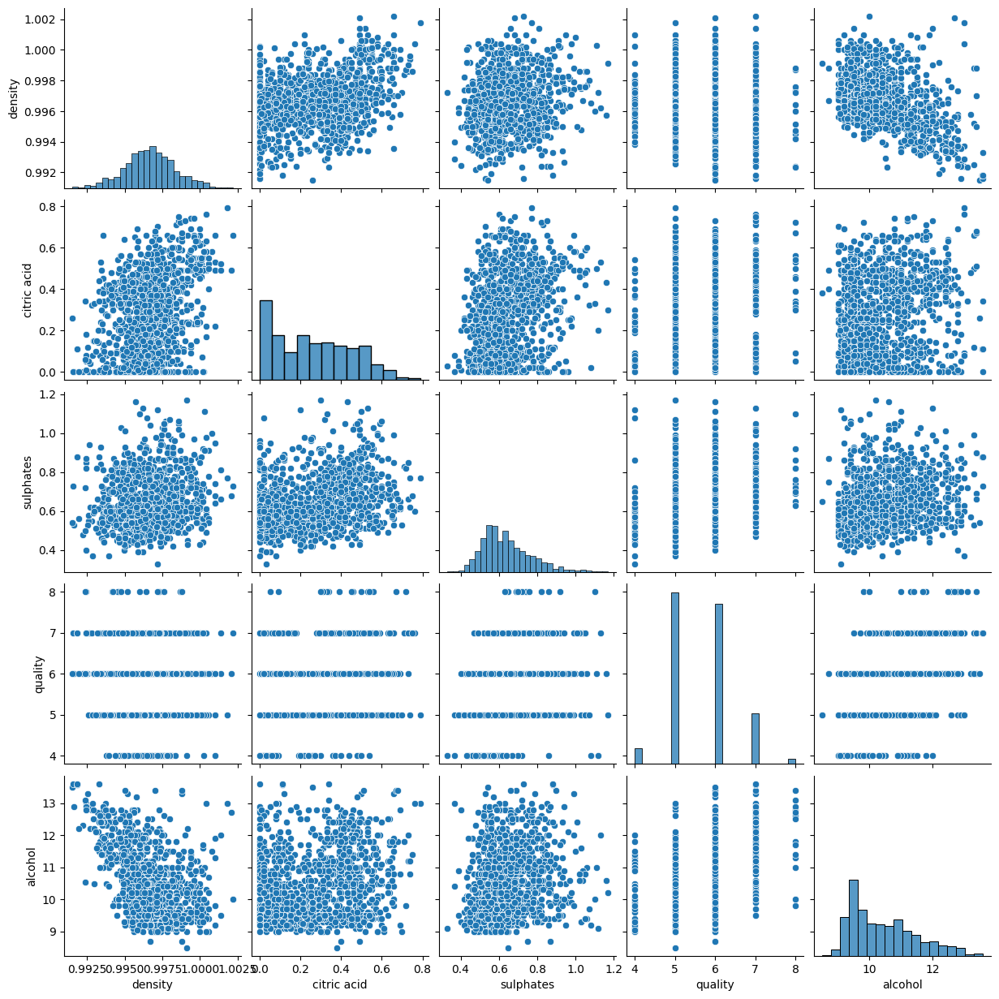

In [ ]:
subData = Newdata[['density','citric acid','sulphates','quality','alcohol']]
sns.pairplot(subData)

# Regression Joint Plot
From interpreting the Regression Joint plot above, we can see a STRONG Negative correlation between pH level & fixed acidity. In other words, as one of these increases, the other decreases. According to the HeatMap, these two features have a correlation coefficent of -0.71.


Text(0.5, 1.0, 'Fixed acidity vs. pH')

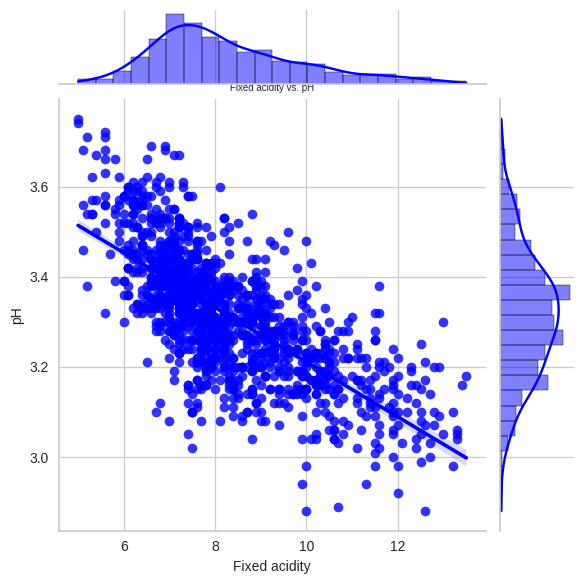

In [ ]:
g = sns.jointplot(x= 'fixed acidity',y= 'pH', data=Newdata,
             kind = 'reg',height=6,color='blue')

plt.xlabel('Fixed acidity',size=10)
plt.ylabel('pH',size=10)
plt.title('Fixed acidity vs. pH',size=7)

# Setup the PyCaret environment

The setup function initializes the training environment and creates the transformation pipeline. Setup function must be called before executing any other function in PyCaret. There are three important things to consider when setting up the PyCaret environment:

1. Data: The dataset (red_wine_df) should be mapped to the ‘data’ variable. Note that ‘red_wine_df’ is just the variable name chose for the dataset.
2. Target: Set the target variable column using the ‘target’ parameter.The target variable is the alcohol column, which represents alcohol level in the red wine.
3. Session ID: This helps to ensure the reproducibility of the code.

In [ ]:
# import pycaret regression and init setup
from pycaret.regression import *
reg = setup(Newdata, target = 'alcohol', session_id = 123,
            # preprocessing
            normalize = True,
            normalize_method = 'minmax',
            # Feature Engineering
            polynomial_features=True, polynomial_degree =2)

,Description,Value
0,Session id,123
1,Target,alcohol
2,Target type,Regression
3,Original data shape,"(1232, 12)"
4,Transformed data shape,"(1232, 78)"
5,Transformed train set shape,"(862, 78)"
6,Transformed test set shape,"(370, 78)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


Here is a brief overview of the code output:

  * Original Data Shape: This shows the number of rows and columns in the dataset. The dataset in this project has 1232 rows and 12 columns, including the target variable.
  * Transformed Train and Transformed Test Set Shape: By default, the original dataset is split into a 70:30 ratio.

In [ ]:
# check all available config
get_config()

{'USI',
 'X',
 'X_test',
 'X_test_transformed',
 'X_train',
 'X_train_transformed',
 'X_transformed',
 '_available_plots',
 '_ml_usecase',
 'data',
 'dataset',
 'dataset_transformed',
 'exp_id',
 'exp_name_log',
 'fold_generator',
 'fold_groups_param',
 'fold_shuffle_param',
 'gpu_n_jobs_param',
 'gpu_param',
 'html_param',
 'idx',
 'is_multiclass',
 'log_plots_param',
 'logging_param',
 'memory',
 'n_jobs_param',
 'pipeline',
 'seed',
 'target_param',
 'test',
 'test_transformed',
 'train',
 'train_transformed',
 'transform_target_param',
 'variable_and_property_keys',
 'variables',
 'y',
 'y_test',
 'y_test_transformed',
 'y_train',
 'y_train_transformed',
 'y_transformed'}

In [ ]:
# Featur Engineering
transformed_dataset = get_config('X_train_transformed')
feature_names = transformed_dataset.columns
print(feature_names)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'quality', 'fixed acidity^2',
       'fixed acidity volatile acidity', 'fixed acidity citric acid',
       'fixed acidity residual sugar', 'fixed acidity chlorides',
       'fixed acidity free sulfur dioxide',
       'fixed acidity total sulfur dioxide', 'fixed acidity density',
       'fixed acidity pH', 'fixed acidity sulphates', 'fixed acidity quality',
       'volatile acidity^2', 'volatile acidity citric acid',
       'volatile acidity residual sugar', 'volatile acidity chlorides',
       'volatile acidity free sulfur dioxide',
       'volatile acidity total sulfur dioxide', 'volatile acidity density',
       'volatile acidity pH', 'volatile acidity sulphates',
       'volatile acidity quality', 'citric acid^2',
       'citric acid residual sugar', 'citric acid chlorides',
       'citric acid free sulfu

In [ ]:
# lets access train dataset
train = get_config('train')
train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,alcohol
1202,8.6,0.42,0.39,1.8,0.068,6.0,12.0,0.99516,3.35,0.69,8,11.7
344,11.9,0.57,0.50,2.6,0.082,6.0,32.0,1.00060,3.12,0.78,6,10.7
741,9.2,0.53,0.24,2.6,0.078,28.0,139.0,0.99788,3.21,0.57,5,9.5
492,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,7,13.4
1565,6.7,0.67,0.02,1.9,0.061,26.0,42.0,0.99489,3.39,0.82,6,10.9


In [ ]:
train.reset_index(drop=True, inplace=True)
# show train dataset
train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,alcohol
0,8.6,0.420,0.39,1.8,0.068,6.0,12.0,0.99516,3.35,0.69,8,11.7
1,11.9,0.570,0.50,2.6,0.082,6.0,32.0,1.00060,3.12,0.78,6,10.7
2,9.2,0.530,0.24,2.6,0.078,28.0,139.0,0.99788,3.21,0.57,5,9.5
3,8.9,0.400,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,7,13.4
4,6.7,0.670,0.02,1.9,0.061,26.0,42.0,0.99489,3.39,0.82,6,10.9
...,...,...,...,...,...,...,...,...,...,...,...,...
857,6.1,0.380,0.15,1.8,0.072,6.0,19.0,0.99550,3.42,0.57,5,9.4
858,6.6,0.895,0.04,2.3,0.068,7.0,13.0,0.99582,3.53,0.58,6,10.8
859,6.3,0.390,0.08,1.7,0.066,3.0,20.0,0.99540,3.34,0.58,5,9.4
860,7.8,0.500,0.09,2.2,0.115,10.0,42.0,0.99710,3.18,0.62,5,9.5


Histogram

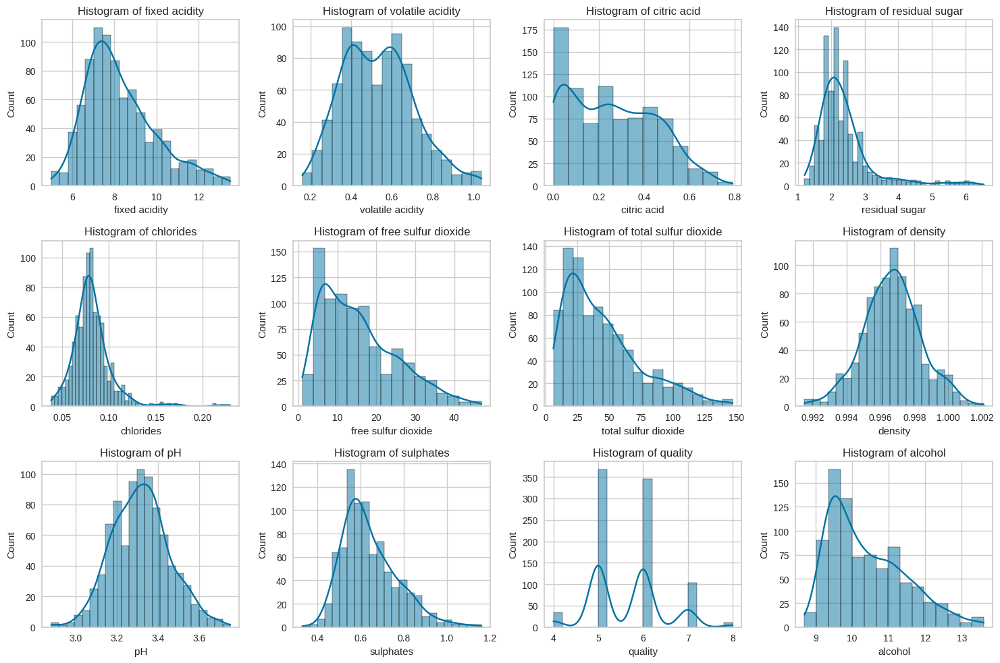

In [ ]:
# Specify the features for which you want to plot histograms
features_to_plot = train.columns[:12]

# Plot histograms for the selected features using Seaborn
plt.figure(figsize=(15, 10))
for i, column in enumerate(features_to_plot, 1):
    plt.subplot(3, 4, i)
    sns.histplot(train[column], kde=True)
    plt.title(f'Histogram of {column}')

plt.tight_layout()
plt.show()

 # Box Plots
 The advantages of showing the Box & Violin plots is that it shows the basic statistics of the data, as well as its distribution. These plots are often used to compare the distribution of a given variable across some categories.In addition, it can provide us with outliers in our data.

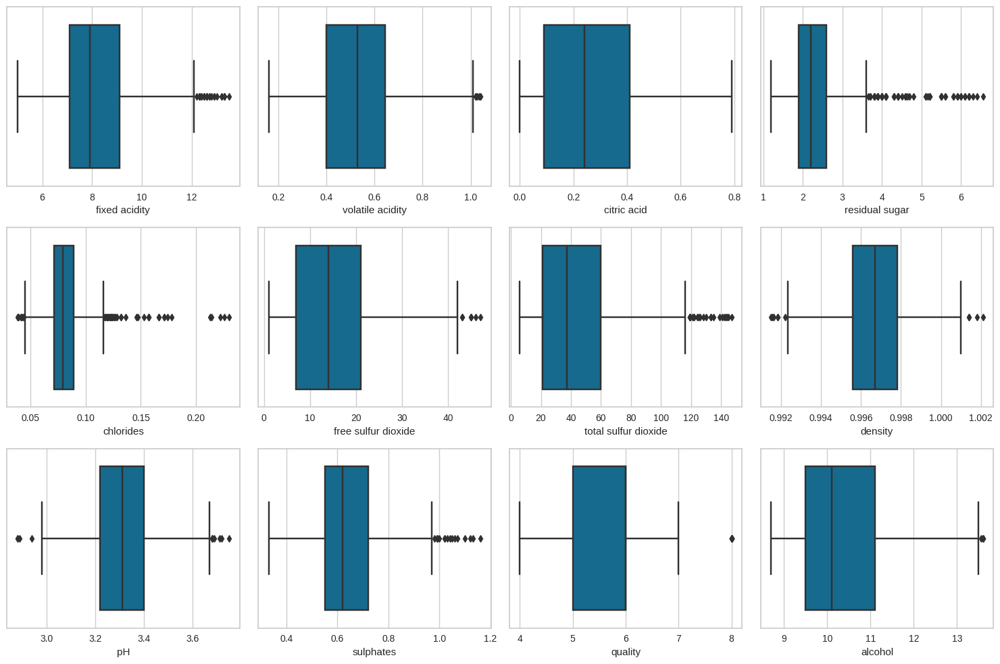

In [ ]:
# Plot box plots for all features
plt.figure(figsize=(15, 10))
for i, column in enumerate(train.columns, 1):
    plt.subplot(3, 4, i)
    sns.boxplot(x=train[column])
plt.tight_layout()
plt.show()

Based on these boxplots, all the variables except quality are either skewed or possibly contain outliers.

# Compare Models

The compare_models function trains and evaluates the performance of all the estimators available in the model library using cross-validation. The output of this function is a scoring grid with average cross-validated scores.

compare_models by default uses all the estimators in model library (all except models with Turbo=False) . To see all available models we can use the function models()


In [ ]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
br,Bayesian Ridge,0.4062,0.2689,0.5168,0.7422,0.0450,0.0389,0.0420
lr,Linear Regression,0.4000,0.2726,0.5193,0.7397,0.0449,0.0382,0.5440
huber,Huber Regressor,0.4090,0.2790,0.5259,0.7329,0.0458,0.0391,0.0920
catboost,CatBoost Regressor,0.3963,0.2811,0.5274,0.7311,0.0453,0.0376,17.3900
ridge,Ridge Regression,0.4188,0.2827,0.5303,0.7296,0.0459,0.0401,0.0780
lightgbm,Light Gradient Boosting Machine,0.4027,0.2954,0.5422,0.7185,0.0466,0.0383,3.9310
gbr,Gradient Boosting Regressor,0.4128,0.2959,0.5424,0.7159,0.0466,0.0393,1.3730
rf,Random Forest Regressor,0.4286,0.3107,0.5558,0.7034,0.0477,0.0408,2.9890
et,Extra Trees Regressor,0.4237,0.3209,0.5636,0.6931,0.0486,0.0404,1.1380
omp,Orthogonal Matching Pursuit,0.4576,0.3432,0.5841,0.6734,0.0506,0.0438,0.0410


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

In [ ]:
# check available models
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [ ]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Custom
ID,,,,,,,,
mae,MAE,MAE,<function mean_absolute_error at 0x7e84dea66050>,neg_mean_absolute_error,pred,{},False,False
mse,MSE,MSE,<function mean_squared_error at 0x7e84dea66200>,neg_mean_squared_error,pred,{},False,False
rmse,RMSE,RMSE,<function mean_squared_error at 0x7e84dea66200>,neg_root_mean_squared_error,pred,{'squared': False},False,False
r2,R2,R2,<function r2_score at 0x7e84dea664d0>,r2,pred,{},True,False
rmsle,RMSLE,RMSLE,<function RMSLEMetricContainer.__init__.<local...,"make_scorer(root_mean_squared_log_error, great...",pred,{},False,False
mape,MAPE,MAPE,<function MAPEMetricContainer.__init__.<locals...,"make_scorer(mean_absolute_percentage_error, gr...",pred,{},False,False


By default compare_models return the single best performing model,Bayesian Redge, based on the metric defined in the sort parameter. Let's change our code to return 3 top models based on MSE.

In [ ]:
best_mse_models_top3 = compare_models(sort = 'MSE', n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
br,Bayesian Ridge,0.4062,0.2689,0.5168,0.7422,0.0450,0.0389,0.0400
lr,Linear Regression,0.4000,0.2726,0.5193,0.7397,0.0449,0.0382,0.0420
huber,Huber Regressor,0.4090,0.2790,0.5259,0.7329,0.0458,0.0391,0.0880
catboost,CatBoost Regressor,0.3963,0.2811,0.5274,0.7311,0.0453,0.0376,17.3420
ridge,Ridge Regression,0.4188,0.2827,0.5303,0.7296,0.0459,0.0401,0.0380
lightgbm,Light Gradient Boosting Machine,0.4027,0.2954,0.5422,0.7185,0.0466,0.0383,3.7320
gbr,Gradient Boosting Regressor,0.4128,0.2959,0.5424,0.7159,0.0466,0.0393,1.3620
rf,Random Forest Regressor,0.4286,0.3107,0.5558,0.7034,0.0477,0.0408,2.7840
et,Extra Trees Regressor,0.4237,0.3209,0.5636,0.6931,0.0486,0.0404,1.1200
omp,Orthogonal Matching Pursuit,0.4576,0.3432,0.5841,0.6734,0.0506,0.0438,0.0400


Processing:   0%|          | 0/87 [00:00<?, ?it/s]

In [ ]:
# list of top 3 models by MSE
best_mse_models_top3

[BayesianRidge(), LinearRegression(n_jobs=-1), HuberRegressor()]

#Blend Model

We blend top 3 models for the best predication model. Blend model is the best model compare to other models with lowest MSE.

In [ ]:
# blend top 3 models
best_model = blend_models(best_mse_models_top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4300,0.2932,0.5414,0.7184,0.0471,0.0408
1,0.4290,0.3088,0.5557,0.7713,0.0472,0.0407
2,0.3471,0.1988,0.4459,0.8061,0.0389,0.0330
3,0.4152,0.3009,0.5486,0.7006,0.0465,0.0392
4,0.3614,0.1927,0.4389,0.8064,0.0391,0.0353
5,0.3920,0.2553,0.5053,0.6742,0.0445,0.0383
6,0.3760,0.2336,0.4833,0.8162,0.0428,0.0364
7,0.3701,0.2210,0.4701,0.7730,0.0413,0.0358
8,0.4351,0.3146,0.5609,0.6776,0.0486,0.0413


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

# Create Model

The create_model function trains and evaluates the performance of a given estimator using cross-validation. The output of this function is a scoring grid with CV scores by fold. We manualy created BayesianRidge, LinearRegression, and Catboost to predict the best model.

In [ ]:
catboost = create_model('catboost')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4260,0.3117,0.5583,0.7006,0.0488,0.0407
1,0.4531,0.3630,0.6025,0.7311,0.0502,0.0423
2,0.3056,0.1752,0.4186,0.8291,0.0357,0.0285
3,0.3936,0.3141,0.5604,0.6876,0.0465,0.0366
4,0.3930,0.2343,0.4841,0.7645,0.0425,0.0380
5,0.3816,0.2604,0.5103,0.6677,0.0450,0.0373
6,0.3867,0.2349,0.4847,0.8152,0.0424,0.0371
7,0.3633,0.2498,0.4998,0.7434,0.0427,0.0345
8,0.4479,0.3481,0.5900,0.6433,0.0513,0.0428


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
linear_model_with_poly = create_model('lr')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4387,0.3197,0.5654,0.6929,0.0486,0.0417
1,0.4266,0.3121,0.5586,0.7688,0.0474,0.0404
2,0.3546,0.2184,0.4673,0.7870,0.0407,0.0337
3,0.4078,0.2892,0.5377,0.7123,0.0454,0.0385
4,0.3697,0.2015,0.4489,0.7975,0.0398,0.0360
5,0.3882,0.2420,0.4920,0.6911,0.0433,0.0379
6,0.3854,0.2446,0.4946,0.8076,0.0436,0.0371
7,0.3528,0.1959,0.4427,0.7988,0.0389,0.0341
8,0.4435,0.3503,0.5919,0.6411,0.0512,0.0419


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
lr_results = pull()
print(type(lr_results))
lr_results

<class 'pandas.core.frame.DataFrame'>


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4387,0.3197,0.5654,0.6929,0.0486,0.0417
1,0.4266,0.3121,0.5586,0.7688,0.0474,0.0404
2,0.3546,0.2184,0.4673,0.7870,0.0407,0.0337
3,0.4078,0.2892,0.5377,0.7123,0.0454,0.0385
4,0.3697,0.2015,0.4489,0.7975,0.0398,0.0360
5,0.3882,0.2420,0.4920,0.6911,0.0433,0.0379
6,0.3854,0.2446,0.4946,0.8076,0.0436,0.0371
7,0.3528,0.1959,0.4427,0.7988,0.0389,0.0341
8,0.4435,0.3503,0.5919,0.6411,0.0512,0.0419


In [ ]:
# train linear regression with fold=3
lr= create_model('lr', fold=3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4137,0.2875,0.5362,0.7513,0.0459,0.0391
1,0.4026,0.2631,0.5130,0.7255,0.0444,0.0388
2,0.4034,0.2975,0.5455,0.7218,0.0474,0.0386
Mean,0.4066,0.2827,0.5315,0.7329,0.0459,0.0388
Std,0.0051,0.0144,0.0137,0.0131,0.0012,0.0002


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
# train linear regression with specific model parameters
create_model('lr', fit_intercept = False)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4393,0.3200,0.5657,0.6926,0.0485,0.0418
1,0.4333,0.3201,0.5658,0.7629,0.0478,0.0410
2,0.3543,0.2270,0.4765,0.7786,0.0413,0.0336
3,0.4138,0.3067,0.5538,0.6949,0.0465,0.0390
4,0.3770,0.2061,0.4540,0.7929,0.0402,0.0367
5,0.3911,0.2510,0.5010,0.6797,0.0440,0.0382
6,0.3929,0.2570,0.5070,0.7978,0.0440,0.0374
7,0.3391,0.1872,0.4327,0.8077,0.0380,0.0328
8,0.4483,0.3609,0.6007,0.6302,0.0520,0.0424


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LinearRegression(fit_intercept=False, n_jobs=-1)

In [ ]:
# train lr and return train score as well alongwith CV
create_model('lr', return_train_score=True)

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LinearRegression(n_jobs=-1)

In [ ]:
br = create_model('br')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4367,0.2927,0.5410,0.7189,0.0472,0.0415
1,0.4425,0.3148,0.5610,0.7668,0.0478,0.0420
2,0.3557,0.2004,0.4477,0.8045,0.0391,0.0339
3,0.4183,0.3083,0.5553,0.6933,0.0472,0.0396
4,0.3695,0.2012,0.4486,0.7978,0.0401,0.0362
5,0.3953,0.2646,0.5144,0.6624,0.0453,0.0387
6,0.3944,0.2414,0.4913,0.8101,0.0435,0.0381
7,0.3858,0.2436,0.4936,0.7498,0.0434,0.0373
8,0.4324,0.3008,0.5484,0.6918,0.0476,0.0413


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# Tune Model

The tune_model function tunes the hyperparameters of the model. The best model is selected based on the metric defined in optimize parameter. Metrics evaluated during cross-validation can be accessed using the get_metrics function. We tuned the hyperparameters of the created models.

Metric to optimize can be defined in MSE.

In [ ]:
# tune model
tuned_catboost = tune_model(catboost)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4608,0.3336,0.5776,0.6795,0.0504,0.0440
1,0.4552,0.3437,0.5863,0.7454,0.0494,0.0429
2,0.3426,0.2013,0.4487,0.8036,0.0385,0.0323
3,0.3783,0.2960,0.5440,0.7056,0.0455,0.0354
4,0.4193,0.2573,0.5073,0.7414,0.0448,0.0408
5,0.3926,0.2790,0.5282,0.6439,0.0458,0.0381
6,0.3970,0.2308,0.4804,0.8185,0.0420,0.0379
7,0.3854,0.2747,0.5241,0.7179,0.0449,0.0367
8,0.4417,0.3471,0.5891,0.6444,0.0510,0.0423


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
# tune model
tuned_lr = tune_model(linear_model_with_poly)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4387,0.3197,0.5654,0.6929,0.0486,0.0417
1,0.4266,0.3121,0.5586,0.7688,0.0474,0.0404
2,0.3546,0.2184,0.4673,0.7870,0.0407,0.0337
3,0.4078,0.2892,0.5377,0.7123,0.0454,0.0385
4,0.3697,0.2015,0.4489,0.7975,0.0398,0.0360
5,0.3882,0.2420,0.4920,0.6911,0.0433,0.0379
6,0.3854,0.2446,0.4946,0.8076,0.0436,0.0371
7,0.3528,0.1959,0.4427,0.7988,0.0389,0.0341
8,0.4435,0.3503,0.5919,0.6411,0.0512,0.0419


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 2 candidates, totalling 20 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
# tune model with metric = MAE
tuned_br = tune_model(br, optimize = 'MSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4368,0.2928,0.5411,0.7188,0.0472,0.0415
1,0.4426,0.3148,0.5611,0.7668,0.0478,0.0420
2,0.3558,0.2004,0.4477,0.8045,0.0391,0.0339
3,0.4184,0.3084,0.5554,0.6932,0.0472,0.0396
4,0.3695,0.2012,0.4486,0.7977,0.0401,0.0362
5,0.3952,0.2645,0.5143,0.6624,0.0453,0.0387
6,0.3945,0.2414,0.4913,0.8101,0.0435,0.0381
7,0.3858,0.2437,0.4936,0.7497,0.0434,0.0373
8,0.4322,0.3005,0.5482,0.6921,0.0476,0.0413


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
# model object
tuned_br

BayesianRidge()

In [ ]:
# tune blended top 3 models
best_model = tune_model(best_model,optimize='MSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4297,0.2935,0.5418,0.7180,0.0471,0.0409
1,0.4239,0.3036,0.5510,0.7751,0.0468,0.0402
2,0.3476,0.2009,0.4482,0.8041,0.0391,0.0331
3,0.4117,0.2954,0.5435,0.7062,0.0460,0.0389
4,0.3635,0.1935,0.4399,0.8055,0.0392,0.0355
5,0.3910,0.2517,0.5017,0.6788,0.0442,0.0382
6,0.3737,0.2329,0.4826,0.8168,0.0427,0.0362
7,0.3666,0.2150,0.4637,0.7792,0.0407,0.0354
8,0.4345,0.3165,0.5626,0.6757,0.0487,0.0413


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Tune model provides an indication of goodness of fit and therefore a measure of how well unseen samples are likely to be predicted by the model, through the proportion of explained variance.

Notice how the results after tuning have been improved:
* BayesianRidge - Before:  74.22%  , After: 74.22%
* LinearRegression - Before:73.97%  , After: 73.97%
* Catboost - Before:73.11% , After:71.91%
* Blended Model - Before:74.71% , After:74.88% with MSE = 0.2622


Metrics alone are not the only criteria you should consider when finalizing the best model for production. Other factors to consider include training time, standard deviation of kfolds etc.

# Ensemble Model

In [ ]:
# ensemble with bagging
ensemble_model(br, method = 'Bagging')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4297,0.2882,0.5368,0.7232,0.0469,0.0408
1,0.4516,0.3292,0.5738,0.7561,0.0488,0.0428
2,0.3498,0.1994,0.4465,0.8055,0.0389,0.0333
3,0.4195,0.3082,0.5551,0.6934,0.0472,0.0397
4,0.3707,0.2029,0.4505,0.7960,0.0403,0.0364
5,0.3994,0.2678,0.5175,0.6582,0.0455,0.0390
6,0.4045,0.2584,0.5083,0.7968,0.0449,0.0391
7,0.3855,0.2417,0.4917,0.7517,0.0432,0.0373
8,0.4346,0.3024,0.5499,0.6902,0.0477,0.0415


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

BaggingRegressor(estimator=BayesianRidge(), random_state=123)

In [ ]:
# ensemble model
ensemble_model(best_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4310,0.2972,0.5452,0.7145,0.0473,0.0409
1,0.4401,0.3217,0.5672,0.7617,0.0481,0.0417
2,0.3429,0.2008,0.4481,0.8042,0.0391,0.0326
3,0.4212,0.3061,0.5532,0.6955,0.0468,0.0398
4,0.3607,0.1905,0.4364,0.8086,0.0389,0.0353
5,0.3911,0.2520,0.5020,0.6784,0.0443,0.0383
6,0.3947,0.2675,0.5172,0.7896,0.0456,0.0381
7,0.3616,0.2086,0.4567,0.7858,0.0402,0.0350
8,0.4422,0.3255,0.5705,0.6665,0.0495,0.0420


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

BaggingRegressor(estimator=BaggingRegressor(estimator=VotingRegressor(estimators=[('Bayesian '
                                                                                   'Ridge',
                                                                                   BayesianRidge()),
                                                                                  ('Linear '
                                                                                   'Regression',
                                                                                   LinearRegression(n_jobs=-1)),
                                                                                  ('Huber '
                                                                                   'Regressor',
                                                                                   HuberRegressor())],
                                                                      n_jobs=-1,
                                                                      weights=[0.67,
                                                                               0.67,
                                                                               0.19]),
                                            random_state=123),
                 random_state=123)

In [ ]:
# stack models
stack_models(best_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4523,0.3400,0.5831,0.6734,0.0500,0.0429
1,0.4388,0.3241,0.5693,0.7600,0.0483,0.0415
2,0.3687,0.2303,0.4799,0.7754,0.0418,0.0351
3,0.4342,0.3343,0.5782,0.6675,0.0484,0.0407
4,0.3575,0.1951,0.4417,0.8039,0.0388,0.0347
5,0.3970,0.2532,0.5032,0.6768,0.0444,0.0389
6,0.4052,0.2644,0.5142,0.7920,0.0454,0.0393
7,0.3393,0.1938,0.4403,0.8009,0.0390,0.0329
8,0.4447,0.3433,0.5859,0.6482,0.0504,0.0421


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

StackingRegressor(cv=5,
                  estimators=[('Voting Regressor',
                               VotingRegressor(estimators=[('Bayesian Ridge',
                                                            BayesianRidge()),
                                                           ('Linear Regression',
                                                            LinearRegression(n_jobs=-1)),
                                                           ('Huber Regressor',
                                                            HuberRegressor())],
                                               n_jobs=-1,
                                               weights=[0.67, 0.67, 0.19])),
                              ('Voting Regressor_1',
                               VotingRegressor(estimators=[('Bayesian Ridge',
                                                            BayesianRidge()),
                                                           ('Linear Regression',
                                                            LinearRe...
                                                           ('Huber Regressor',
                                                            HuberRegressor())],
                                               n_jobs=-1,
                                               weights=[0.67, 0.67, 0.19])),
                              ('Voting Regressor_9',
                               VotingRegressor(estimators=[('Bayesian Ridge',
                                                            BayesianRidge()),
                                                           ('Linear Regression',
                                                            LinearRegression(n_jobs=-1)),
                                                           ('Huber Regressor',
                                                            HuberRegressor())],
                                               n_jobs=-1,
                                               weights=[0.67, 0.67, 0.19]))],
                  final_estimator=LinearRegression(n_jobs=-1), n_jobs=-1,
                  passthrough=True)

 For now, let's move forward considering the blended model as our best model for the remainder of this project.

# Analyze Model

The plot_model function is used to analyze the performance of a trained model on the test set. It may require re-training the model in certain cases.

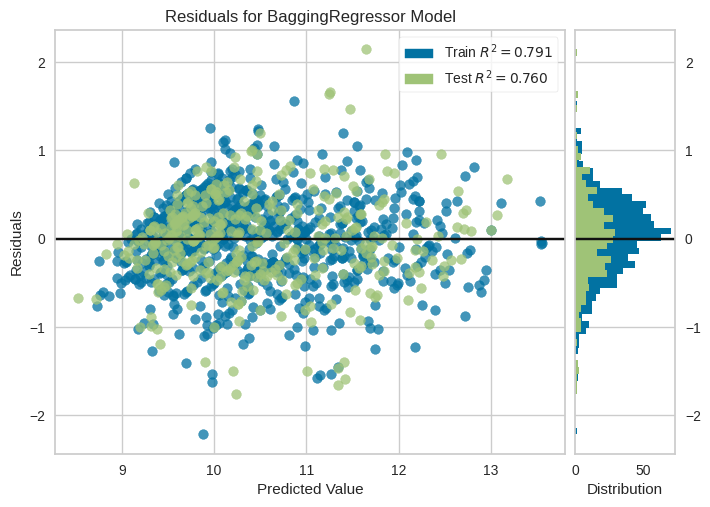

In [ ]:
# plot residuals
plot_model(best_model, plot = 'residuals')

In [ ]:
# to save the plot
plot_model(best_model, plot = 'residuals', save=True)

'Residuals.png'

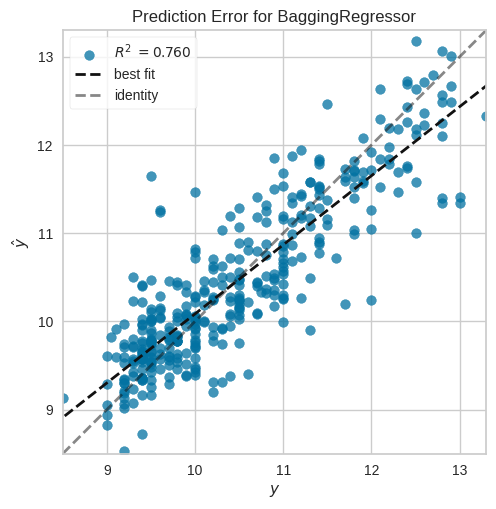

In [ ]:
# plot error
plot_model(best_model, plot = 'error')

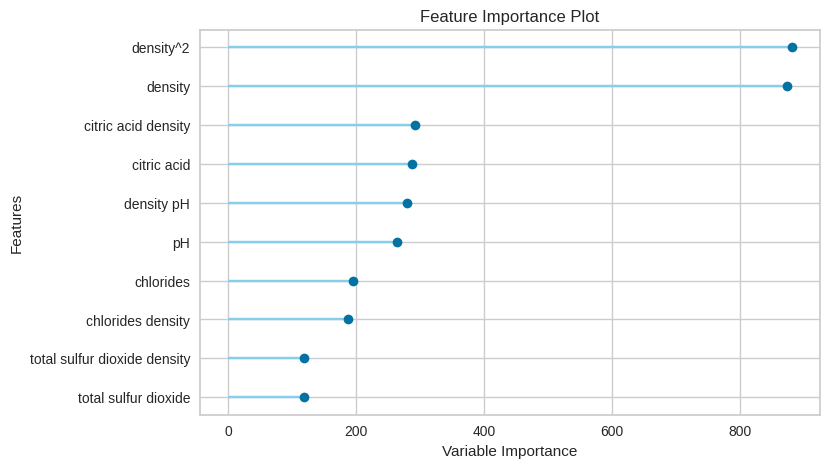

In [ ]:
# plot feature importance
plot_model(linear_model_with_poly, plot = 'feature')

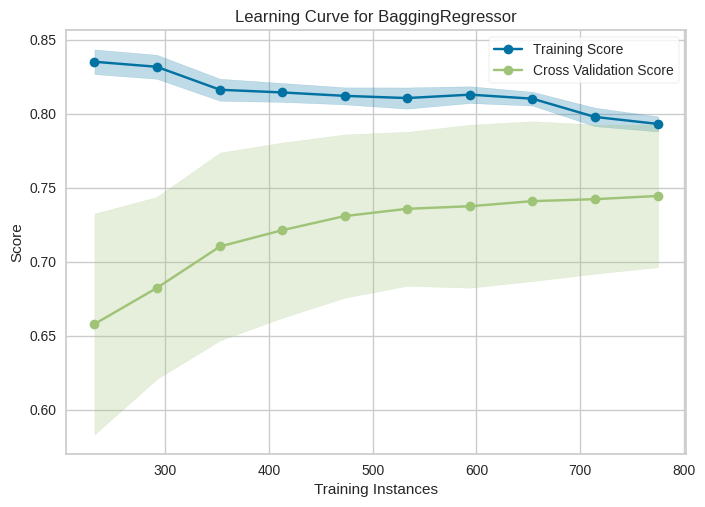

In [ ]:
plot_model(best_model, plot = 'learning')

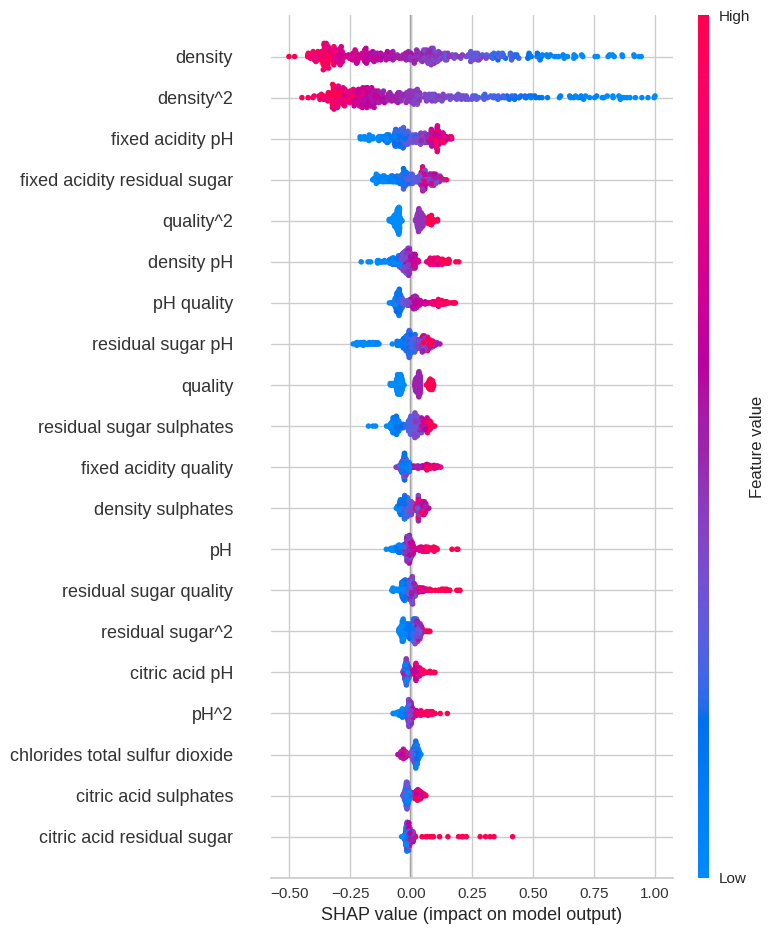

In [ ]:
# interpret summary model
interpret_model(catboost, plot = 'summary')

In [ ]:
# reason plot for test set observation 1
interpret_model(catboost, plot = 'reason', observation = 1)

In [ ]:
evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Prediction

The predict_model function returns prediction_label as new column to the input dataframe. When data is None (default), it uses the test set (created during the setup function) for scoring.

In [ ]:
# predict on test set
Predict_test = predict_model(best_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Bagging Regressor,0.3839,0.2628,0.5126,0.7603,0.0441,0.0365


In [ ]:
# show predictions data
Predict_test.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,alcohol,prediction_label
207,7.8,0.57,0.31,1.8,0.069,26.0,120.0,0.99625,3.29,0.53,5,9.3,9.424547
918,8.4,0.36,0.32,2.2,0.081,32.0,79.0,0.99640,3.30,0.72,6,11.0,10.661426
205,12.8,0.30,0.74,2.6,0.095,9.0,28.0,0.99940,3.20,0.77,7,10.8,11.321787
1407,6.0,0.51,0.00,2.1,0.064,40.0,54.0,0.99500,3.54,0.93,6,10.7,11.407165
201,8.8,0.37,0.48,2.1,0.097,39.0,145.0,0.99750,3.04,1.03,5,9.3,10.227978


In [ ]:
Predict_test.reset_index(drop=True, inplace=True)
# show predictions data
Predict_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,alcohol,prediction_label
0,7.8,0.570,0.31,1.8,0.069,26.0,120.0,0.99625,3.29,0.53,5,9.3,9.424547
1,8.4,0.360,0.32,2.2,0.081,32.0,79.0,0.99640,3.30,0.72,6,11.0,10.661426
2,12.8,0.300,0.74,2.6,0.095,9.0,28.0,0.99940,3.20,0.77,7,10.8,11.321787
3,6.0,0.510,0.00,2.1,0.064,40.0,54.0,0.99500,3.54,0.93,6,10.7,11.407165
4,8.8,0.370,0.48,2.1,0.097,39.0,145.0,0.99750,3.04,1.03,5,9.3,10.227978
...,...,...,...,...,...,...,...,...,...,...,...,...,...
365,9.5,0.370,0.52,2.0,0.082,6.0,26.0,0.99800,3.18,0.51,5,9.5,9.537993
366,7.3,0.365,0.49,2.5,0.088,39.0,106.0,0.99660,3.36,0.78,5,11.0,10.295137
367,7.6,0.310,0.34,2.5,0.082,26.0,35.0,0.99356,3.22,0.59,7,12.5,12.109706
368,10.6,0.500,0.45,2.6,0.119,34.0,68.0,0.99708,3.23,0.72,6,10.9,11.499598


# Finalize Model



In [ ]:
final_best = finalize_model(best_model)

In [ ]:
#Final best model parameters for deployment
print(final_best)

Pipeline(memory=Memory(location=None),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['fixed acidity',
                                             'volatile acidity', 'citric acid',
                                             'residual sugar', 'chlorides',
                                             'free sulfur dioxide',
                                             'total sulfur dioxide', 'density',
                                             'pH', 'sulphates', 'quality'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[],
                                    transformer=SimpleIm...
                ('normalize', TransformerWrapper(transformer=MinMaxScaler())),
                ('clean_column_names',
                 TransformerWrapper(transformer=CleanColumnNames())),
                ('actual_estimator',
                 BaggingRegressor(estimat

In [ ]:
final_best

Pipeline(memory=Memory(location=None),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['fixed acidity',
                                             'volatile acidity', 'citric acid',
                                             'residual sugar', 'chlorides',
                                             'free sulfur dioxide',
                                             'total sulfur dioxide', 'density',
                                             'pH', 'sulphates', 'quality'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[],
                                    transformer=SimpleIm...
                ('normalize', TransformerWrapper(transformer=MinMaxScaler())),
                ('clean_column_names',
                 TransformerWrapper(transformer=CleanColumnNames())),
                ('actual_estimator',
                 BaggingRegressor(estimator=VotingRegressor(estimators=[('Bayesian '
                                                                         'Ridge',
                                                                         BayesianRidge()),
                                                                        ('Linear '
                                                                         'Regression',
                                                                         LinearRegression(n_jobs=-1)),
                                                                        ('Huber '
                                                                         'Regressor',
                                                                         HuberRegressor())],
                                                            n_jobs=-1,
                                                            weights=[0.67, 0.67,
                                                                     0.19]),
                                  random_state=123))])

In [ ]:
predict_model(final_best);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Bagging Regressor,0.4244,0.3004,0.5481,0.7260,0.0475,0.0399


Notice how the R2 in the final_best has decreased to 0.7260 from 0.7603, even though the model is same. This is because the final_best variable is trained on the complete dataset including the test/hold-out set.

# Save Model
Finally, we can save the entire pipeline on disk for later use, using pycaret's save_model function.

In [ ]:
# save model
save_model(best_model, 'best_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['fixed acidity',
                                              'volatile acidity', 'citric acid',
                                              'residual sugar', 'chlorides',
                                              'free sulfur dioxide',
                                              'total sulfur dioxide', 'density',
                                              'pH', 'sulphates', 'quality'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[],
                                     transformer=SimpleIm...
                 ('normalize', TransformerWrapper(transformer=MinMaxScaler())),
                 ('clean_column_names',
                  TransformerWrapper(transformer=CleanColumnNames())),
                 ('trained_model',
                  BaggingReg

# Load Model

In [ ]:
# load pipeline
loaded_best_pipeline = load_model('best_pipeline')
loaded_best_pipeline

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=/tmp/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['fixed acidity',
                                             'volatile acidity', 'citric acid',
                                             'residual sugar', 'chlorides',
                                             'free sulfur dioxide',
                                             'total sulfur dioxide', 'density',
                                             'pH', 'sulphates', 'quality'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[],
                                    transform...
                ('normalize', TransformerWrapper(transformer=MinMaxScaler())),
                ('clean_column_names',
                 TransformerWrapper(transformer=CleanColumnNames())),
                ('trained_model',
                 BaggingRegressor(estimator=VotingRegressor(estimators=[('Bayesian '
                                                                         'Ridge',
                                                                         BayesianRidge()),
                                                                        ('Linear '
                                                                         'Regression',
                                                                         LinearRegression(n_jobs=-1)),
                                                                        ('Huber '
                                                                         'Regressor',
                                                                         HuberRegressor())],
                                                            n_jobs=-1,
                                                            weights=[0.67, 0.67,
                                                                     0.19]),
                                  random_state=123))])

In [ ]:
# predict test set on saved model
new_prediction = predict_model(loaded_best_pipeline)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Bagging Regressor,0.3839,0.2628,0.5126,0.7603,0.0441,0.0365


In [ ]:
# show predictions data
new_prediction.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,alcohol,prediction_label
207,7.8,0.57,0.31,1.8,0.069,26.0,120.0,0.99625,3.29,0.53,5,9.3,9.424547
918,8.4,0.36,0.32,2.2,0.081,32.0,79.0,0.99640,3.30,0.72,6,11.0,10.661426
205,12.8,0.30,0.74,2.6,0.095,9.0,28.0,0.99940,3.20,0.77,7,10.8,11.321787
1407,6.0,0.51,0.00,2.1,0.064,40.0,54.0,0.99500,3.54,0.93,6,10.7,11.407165
201,8.8,0.37,0.48,2.1,0.097,39.0,145.0,0.99750,3.04,1.03,5,9.3,10.227978



# Deploying Pipeline
I've decided to save the pipeline with the aim of deploying my model.



In [ ]:
import joblib
joblib.dump(loaded_best_pipeline, 'wine_alcohol_prediction.pkl')


['wine_alcohol_prediction.pkl']

# Conclusions

In Conclusion, Out of the 11 features we examined, the top 4 significant features that affect the alcohol in Red Wine are low levels of sulfur dioxide, and high levels of citric acid, density, and quality. Our blended model with top 3 best model such as  BayesianRidge, LinearRegression and, HuberRegressor yields the highest R² value, 75% with lowest MSE = 0.2622. Thus, 75% is the ideal accuracy of our model. Our machine learning algorithm can now predict the alcohol content in red wine given its ratio of ingredients. By detecting these important features, we may increase the quality of the wine